# Исследование рынка заведений общественного питания в Москве

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Для начала они просят аналитика подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. 

## Описание данных
Датасет составлен на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

**Файл moscow_places.csv:**
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Цель исследования
- Найти закономерности на рынке общественного питания в Москве
- Выбрать лучшую категорию и место для открытия завдения в Москве
- Выбрать место для открытия кофейни

## Ход работы
- Изучение данных
- Предорботка данных
- Анализ данных по заведениям общественного питания
- Анализ рынка кофеен
- Выводы и рекомендации

**Импорт библиотек**

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from plotly import graph_objects as go
import plotly.express as px

#модуль для работы с JSON-форматом
import json

from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import folium

## Просмотр данных

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датасете содержится информация о 8406 заведений в Москве.

## Предоработка данных

### Посмотрим на долю пропущенных значений в данных.

In [4]:
data['name'].shape[0]

8406

In [5]:
data['hours'].isna().sum()

536

In [6]:
for i in data.columns:
    shape = round((data[i].isna().sum()/data[i].shape[0])*100, 2)
    print(i, shape, '%')

name 0.0 %
category 0.0 %
address 0.0 %
district 0.0 %
hours 6.38 %
lat 0.0 %
lng 0.0 %
rating 0.0 %
price 60.56 %
avg_bill 54.6 %
middle_avg_bill 62.54 %
middle_coffee_cup 93.64 %
chain 0.0 %
seats 42.96 %


- В столбце **hours** пропущено 6% данных, их можно ничем не заполнять.
- В столбце **price** пропущено целых 60% данных. Их можно заполнить исходя из информации в столбце middle_avg_bill
- В столбцах **avg_bill**, **middle_avg_bill** и **middle_coffee_cup** пропущенные значения вполне закновомерны. Их не стоит чем-либо заполнять.
- В столбце **seats** такж не получится предугадать значения, поэтому пропуски оставим как есть.

### Проверим явные и неявные дубликаты

In [7]:
data.duplicated().sum()

0

In [8]:
data.duplicated(subset=['name', 'address']).sum()

0

In [9]:
#неявные дубликаты
for i in data.columns:
    if i in  ['category', 'district']:
        unique = list(data[i].unique())
        print(i, '-', unique)
        print()

category - ['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая']

district - ['Северный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ', 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ']



Явных и неявных дубликатов в датасете нет.

### Создадим дополнительные столбцы

In [10]:
#создаем функцию для извлечения названия улицы
def extract_street(address):
    split_address = address.split(',')
    street = split_address[1].strip()
    return street

In [11]:
#создадим столбец с названием улицы
data['street'] = data['address'].apply(extract_street)

In [12]:
#создадим столбец о круглосуточных заведения
data['is_24'] = data['hours'].str.contains('круглосуточно', case=False)


### Посмотрим на выбросы

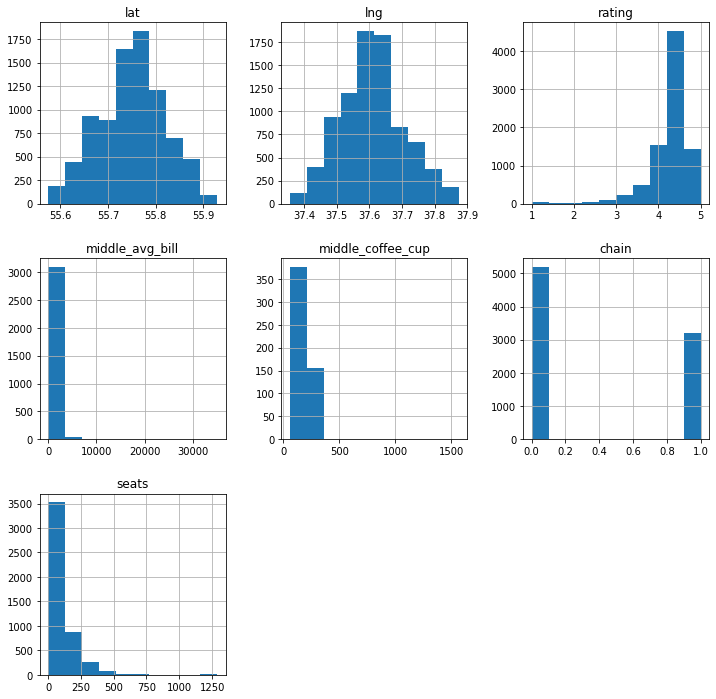

In [13]:
data.hist(figsize=(12,12));

Выбросы можно заметить в количестве посадочных мест в заведении. Однако такие большие заведения действительно могут быть, поэтому не будем удалять эту часть данных.

### Устаним ошибки в несетевых заведениях

In [14]:
#выделим только несетевые заведение
not_chain = data.loc[data['chain']==0]
for_errors = not_chain.groupby('name').agg({'name':'count'})
for_errors.columns = ['count']
errors = for_errors.loc[for_errors['count'] > 1]
errors


,count
name,
Бистро,12
Блины,3
Буфет,8
Кафе,189
Кафе для поминок,2
Кафе-кулинария,2
Кафе-столовая,9
Кофейня,12
Пиццерия,3


По таблице видно, что такие заведения просто не имеют названий, однако это  не является основанием полагать, что они сетевые.

- Бала проведена предоработка данных, просмотрены пропущенные значения, которые не стоит заполнять. 
- Также проведена проверка на явные и неявные дубликаты - таких нет. 
- Добавлены два новых столбца: с название улицы и маркером круглосуточного заведения. 
- Выбросы замечены только в количестве посадочных мест в заведении, однако их стоит оставить.
- Ошибки в столбце с маркером сетевого завдения возникают из-за отсутствия четкого названия у заведения

## Анализ данных

In [15]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Посмотрим, как распределены категории заведений

In [16]:
category = data.groupby('category').agg({'category':'count'})
category.columns = ['count']
category = category.sort_values(by='count', ascending=False)
category

,count
category,
кафе,2378
ресторан,2043
кофейня,1413
"бар,паб",765
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


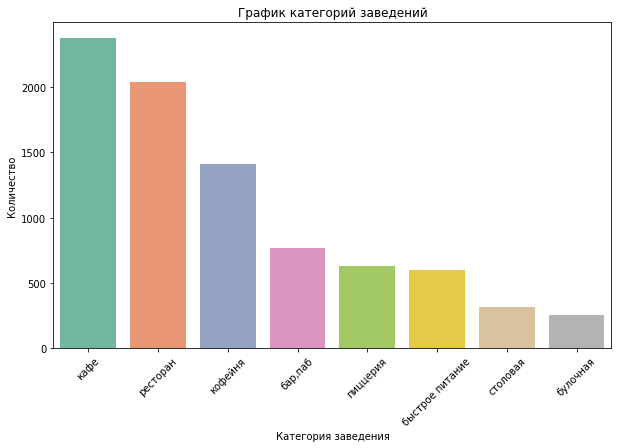

In [17]:
plt.figure(figsize=(10, 6))
sns.set_palette("Set2") 
sns.barplot(x=category.index, y='count', data=category)
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.title('График категорий заведений')
plt.xticks(rotation=45);

Заведений типа "кафе" в Москве больше всего - 2378, чуть меньше ресторанов - 2043. Наименее многочисленная категория - булочные (256) и столовые (315).

### Посмотрим на кол-во посадочных мест на заведение по категориям

In [18]:
seats = data.groupby('category').agg({'seats':'sum', 'category':'count'})
seats['seats per place'] = round(seats['seats']/seats['category'], 2)
seats = seats.sort_values('seats per place', ascending=False)
seats

,seats,category,seats per place
category,,,
"бар,паб",58281.0,765,76.18
ресторан,154869.0,2043,75.80
пиццерия,40350.0,633,63.74
кофейня,83511.0,1413,59.10
быстрое питание,34513.0,603,57.24
столовая,16359.0,315,51.93
булочная,13229.0,256,51.68
кафе,118770.0,2378,49.95


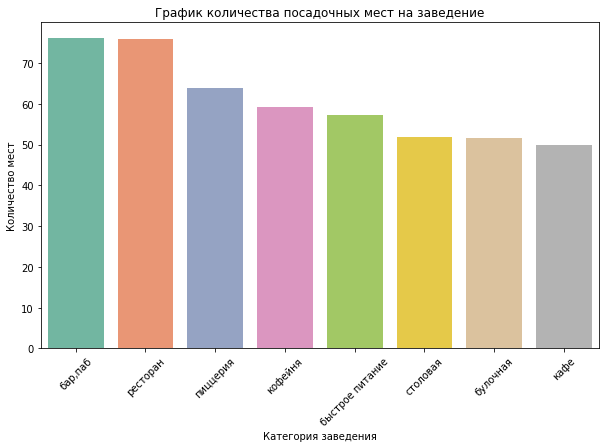

In [66]:
plt.figure(figsize=(10, 6))
sns.barplot(x=seats.index, y='seats per place', data=seats)
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')
plt.title('График количества посадочных мест на заведение')
plt.xticks(rotation=45);

Больше всего посадочных мест в баре, пабе и в ресторане - у них примерно 75 мест на заведение. Меньше всего - в кафе, булочных и столовых, там количество мест примерно 50.

### Посмотрим на соотношение сетевых и несетевых заведений

In [20]:
chains = data.groupby('chain').agg({'chain':'count'})
chains

,chain
chain,
0,5201
1,3205


1 - сетевое заведение \
0 - не сетевое

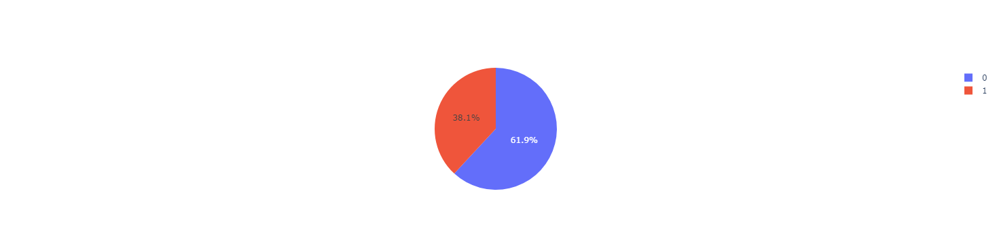

In [21]:
fig = go.Figure(data=[go.Pie(labels=chains.index, values=chains['chain'])]) 
fig.show()

Сетевые заведения составляют 38% от общего количества, а несетевые - 62%. Несетевых завеедений гораздо больше.

### Посмотрим, какие категории заведений чаще являются сетевыми

In [22]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [23]:
data_chain = data.loc[data['chain']==1]

In [24]:
chains = data_chain.groupby('category').agg({'category':'count'})
chains.columns = ['count'] 
chains = chains.sort_values(by='count')
chains

,count
category,
столовая,88
булочная,157
"бар,паб",169
быстрое питание,232
пиццерия,330
кофейня,720
ресторан,730
кафе,779


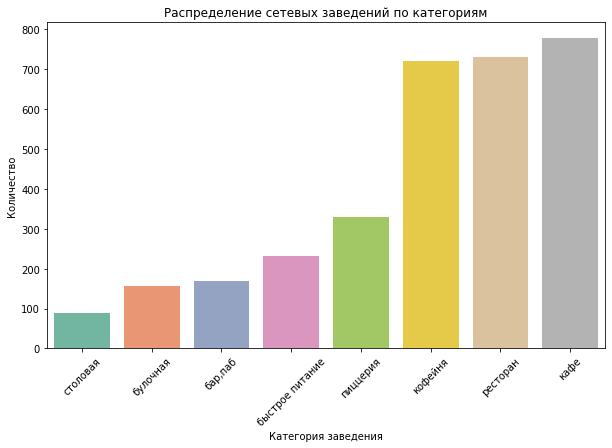

In [25]:
plt.figure(figsize=(10, 6))
sns.barplot(x=chains.index, y='count', data=chains)
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.title('Распределение сетевых заведений по категориям')
plt.xticks(rotation=45);

На графике видно, что наибольшее количество сетевых заведений представляют собой кафе (779), рестораны (730) и кофейни (720. Наименьшее количество сетевых столовых (88) и булочных (157).

### Топ-15 сетевых заведений

In [26]:
top_name = data_chain.groupby(['name']).agg({'name':'count'})
top_name.columns = ['count']
top_name.sort_values(by='count', ascending=False).head(15)

,count
name,
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Яндекс Лавка,69
Cofix,65
Prime,50
Хинкальная,44
КОФЕПОРТ,42


<div class="alert alert-block alert-success">
<b>Комментарий ревьюера:</b> 
    
Ты правильно выделила популярные сети.
</div>

С большим отрывом самое многочисленное заведение Москвы - Шоколадница. Потом идет Доминос Пицца и Додо Пицца. И правда, эти заведения мы встречаем повсюду.

In [27]:
chain = data_chain.groupby(['category', 'name']).agg({'name':'count'})
chain.columns = ['count']
chain = chain.sort_values(by='count', ascending=False).head(15)
chain = chain.reset_index()

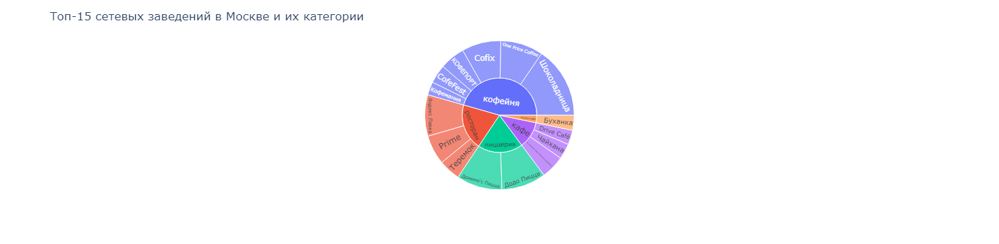

In [28]:
fig = px.sunburst(chain, path=['category', 'name'], values='count')
fig.update_layout(title='Топ-15 сетевых заведений в Москве и их категории')
fig.show()

Топ-15 сетевых заведений это в большинстве своем кофейня , ресторан  или пиццерия

### Анализ заведений по административным районам Москвы

In [29]:
data.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False)

,name
district,
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


In [30]:
#узнаем, сколько заведений в каждом административном районе                           
district = data.pivot_table(index='category', 
                                   values='name', 
                                   columns = 'district', 
                                   aggfunc = 'count').sort_values(by='category')

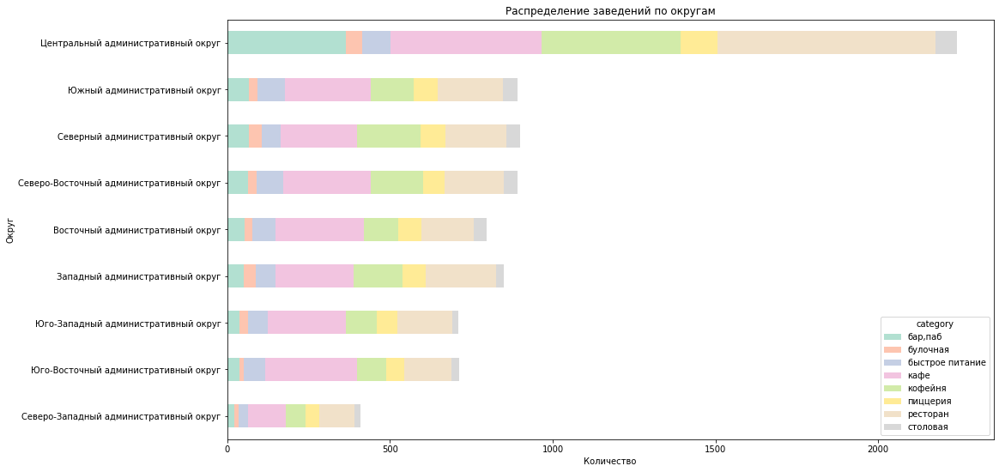

In [31]:
fig, ax = plt.subplots(figsize=(20, 10))
district.T.sort_values(by='бар,паб').plot(kind='barh', stacked=True, ax=ax, figsize=(16,9), alpha=0.5)
plt.xlabel('Количество')
plt.ylabel('Округ')
plt.title('Распределение заведений по округам');

Больше всего заведений в ЦАО, а меньше всего в Северо-Западном округе (409). Причем количество заведений в ЦАО (2242) сильно превышает остальные районы. По категориям в ЦАО, как и во всех остальных округах, лидируют ресторны, кафе и кофейни. В ЦАО также немало баров и пабов, в то время как в других районах их кол-во небольшое.

### Распределение медианных рейтингов по категориям заведений

In [32]:
rating = data.groupby('category').agg({'rating':'median'}).sort_values(by='rating', ascending=False)
rating

,rating
category,
"бар,паб",4.4
булочная,4.3
кофейня,4.3
пиццерия,4.3
ресторан,4.3
столовая,4.3
быстрое питание,4.2
кафе,4.2


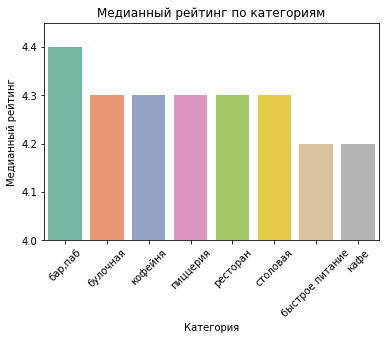

In [33]:
ax = sns.barplot(x=rating.index, y='rating', data=rating)
ax.set_ylim(4, 4.45)
plt.xlabel('Категория')
plt.ylabel('Медианный рейтинг')
plt.title('Медианный рейтинг по категориям')
plt.xticks(rotation=45);

In [34]:
data['rating'].mean()

4.229895312871758

Средний рейтинг всех категорий больше 4. Наибольший в барах,пабах - 4.4. Чуть меньше рейтинг в кафе и быстром питании  - 4.2, у всех остальных - 4.3. Различия в медианном значении рейтингов всех заведений не очень большие.

### Распределение средних рейтингов по районам

In [35]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [36]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

В Северо-Восточном административном округе находится заведения с самым высоким медианным рейтингом (от 4.7 до 5). В ВАО - самые низкооцениваемые заведения (от 3.3 до 3.6). В ЦАО и ЮАО дела обстоят чуть лучше (от 3.9 до 4.2). В остальных районом медианныхй рейтинг от 4.2 до 4.4.

### Все заведения Москвы

In [37]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений.

In [38]:
streets = data.groupby('street').agg({'name':'count'}).sort_values(by='name', ascending=False).reset_index().head(15)
streets.columns = ['street','name']
streets

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [39]:
top_street_data = data[data['street'].isin(streets['street'])]

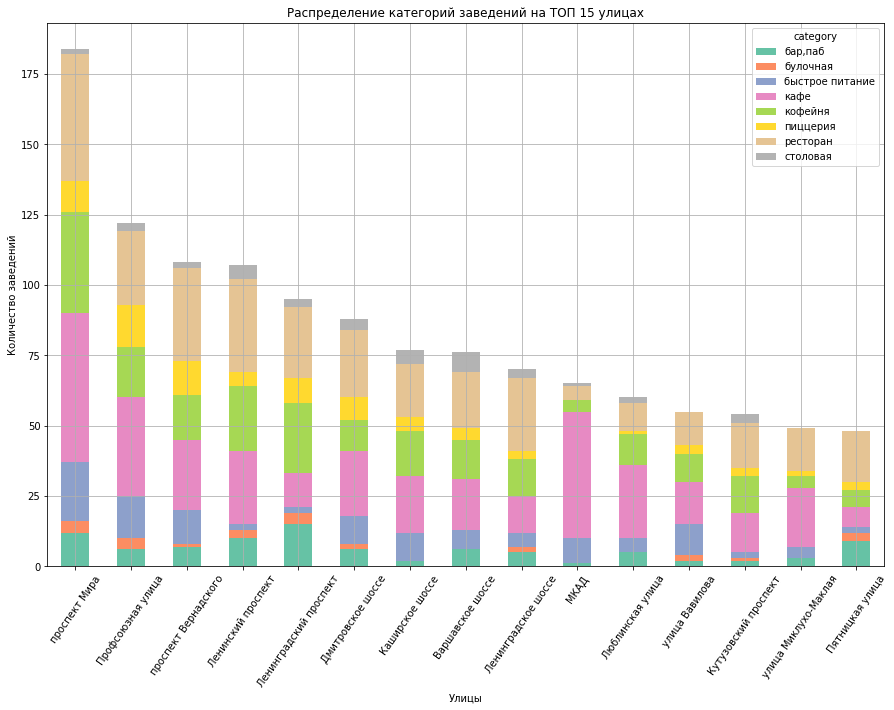

In [40]:
streets = top_street_data.pivot_table(
index = 'category',
columns = 'street',
values = 'name',
aggfunc = 'count'
)

# отсортируем значения 
sorting = streets.sum().sort_values(ascending = False)


# построим график
streets[sorting.index].T.plot.bar(stacked = True, figsize = (15,10))
plt.xticks(rotation=55)
plt.title('Распределение категорий заведений на ТОП 15 улицах')
plt.xlabel('Улицы') 
plt.ylabel('Количество заведений')
plt.grid()
plt.show()

Наибольшее количество заведений находится на проспекте Мира (более 184), чуть меньше на Профсоюзной улице (122) и на проспекте Вернандского (108). Из категорий преобладают кафе, кофейни и рестораны почти на всех улицах. Чуть меньше ресторанов быстрого питания. Эти улицы очень длинные, поэтому не удивительно, что они оказались в топе по кол-ву заведений.

In [41]:
one_object = data.groupby('street').agg({'name':'count'}).reset_index().sort_values(by='name')
one_object.columns = ['street', 'name']
one_object = one_object.loc[one_object['name'] == 1]

one_object

,street,name
0,1-й Автозаводский проезд,1
683,Одинцовская улица,1
689,Октябрьский переулок,1
694,Ордынский тупик,1
695,Оренбургская улица,1
...,...,...
124,3-й Хорошёвский проезд,1
217,Бобров переулок,1
218,Богословский переулок,1
138,4-й Лесной переулок,1


В Москве есть 458 улиц, где находится всего 1 заведение. Посмотрим, что это за заведения.

In [42]:
single = data[data['street'].isin(one_object['street'])]

In [43]:
ax = single.groupby('category').agg({'name':'count'}).reset_index().sort_values(by='name')
ax

,category,name
1,булочная,8
5,пиццерия,15
2,быстрое питание,23
7,столовая,36
0,"бар,паб",39
4,кофейня,84
6,ресторан,93
3,кафе,160


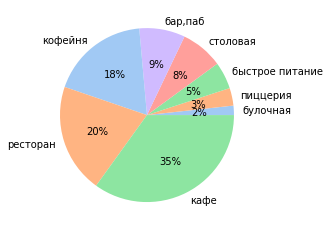

In [44]:
colors = sns.color_palette('pastel')[ 0:5 ]
plt.pie(ax['name'], labels=ax['category'], autopct='%.0f%%', colors = colors)
plt.show()

Чаще всего одиночные заведения на улице - это кафе (35% из всех одиночных заведений), реже - булочная (всего 5%). Также часто одиночное завдение - это кофейня (18%).

### Средний чек по административным округам

В столбце **middle_avg_bill** указан медианный средний чек.

In [45]:
a = data.groupby('district').agg({'middle_avg_bill':'median'}).reset_index().sort_values(by='middle_avg_bill', ascending=False)
a

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

Choropleth(
    geo_data=state_geo,
    data=a,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний чек',
).add_to(m)

m

Наибольший средний чек в ЦАО и ЗАО (при этом в ЗАО меньше всего заведений) - самые дорогие районы Москвы. Там средний чек достигает 1000 рублей. На Юге и на севере заведения с самым маленьким средним чеком.

### Как заведения распределены по цене

In [47]:
data.groupby('price').agg({'name':'count'}).sort_values('name', ascending=False)

,name
price,
средние,2117
выше среднего,564
высокие,478
низкие,156


В Москве больше всего заведений с средним чеком. Меньше всего - с низкими ценами. Посмотрим, как распределены средние цены по категориям.

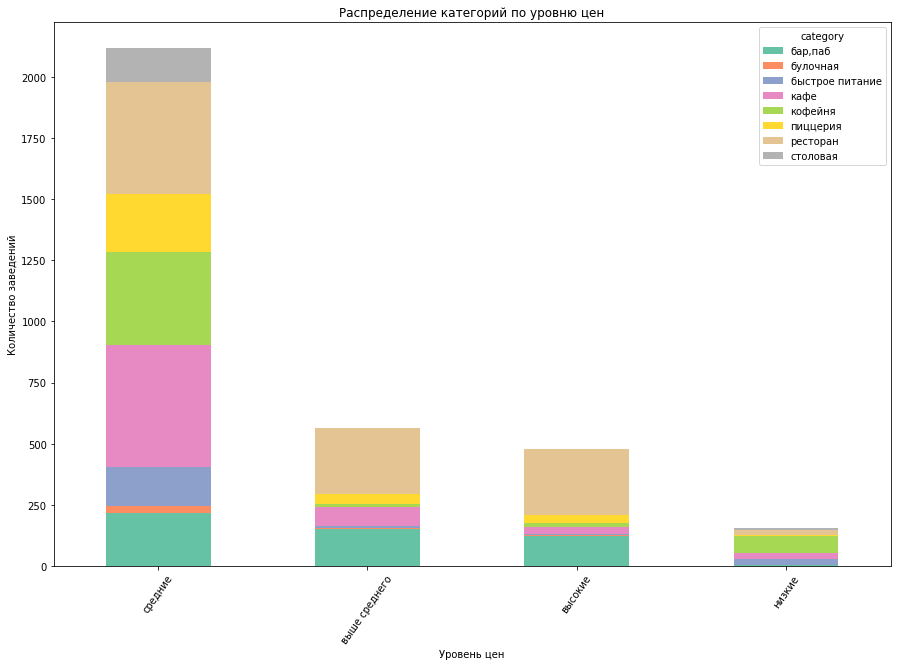

In [48]:
price = data.pivot_table(
index = 'category',
columns = 'price',
values = 'name',
aggfunc = 'count'
)

# отсортируем значения 
sorting = price.sum().sort_values(ascending = False)


# построим график
price [sorting.index].T.plot.bar(stacked = True, figsize = (15,10))
plt.xticks(rotation=55)
plt.title('Распределение категорий по уровню цен')
plt.xlabel('Уровень цен') 
plt.ylabel('Количество заведений')
plt.show()

Со средними ценами чаще всего встречаются заведения: ресторан, кофейня, кафе, бар или паб. С ценами выше среднего и высокими - рестораны и бары или пабы. К низким ценам чаще всего относятся кофейни.

### У каких заведений низкий рейтинг?

Посмотрим, у каких заведений чаще всего низкий ретинг, а также, какие цены у таких заведений.

In [49]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

25% из всех заведений имеет рейтинг меньше 4.1. За "плохой" рейтинг будет считать оценку меньше 3.5, как и на хороплёте выше.

In [50]:
bad_rating = data.loc[data['rating']<=3.5]

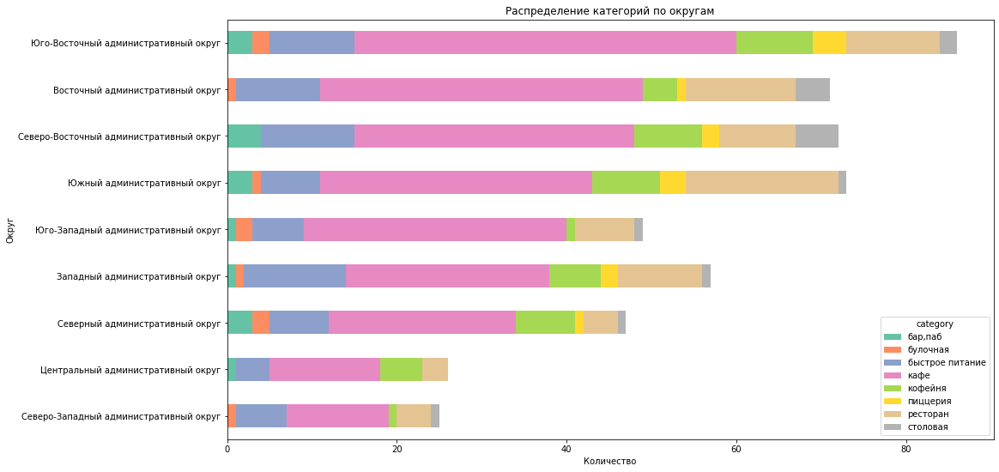

In [51]:
bad = bad_rating.pivot_table(index='category', 
                                   values='name', 
                                   columns = 'district', 
                                   aggfunc = 'count')

fig, ax = plt.subplots(figsize=(20, 10))
bad.T.sort_values(by='кафе').plot(kind='barh', stacked=True, ax=ax, figsize=(16,9))
plt.title('Распределение категорий по округам')
plt.xlabel('Количество') 
plt.ylabel('Округ');

Больше всего плохих рейтингов в ЮВАО, а также а ЮАО. Обычно плохо оценивают кафе, чуть реже ресторны быстрого питания и кофейни. Посмотрим еще, как связаны плохие оценки и ценовая категория.

**Также посмотрим, какая ценовая категория у заведений с плохим рейтингом**

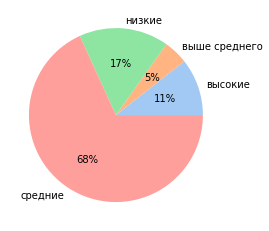

In [52]:
bad_price = bad_rating.pivot_table(index='price', 
                                   values='name',  
                                   aggfunc = 'count').reset_index()

colors = sns.color_palette('pastel')[ 0:5 ]
plt.pie(bad_price['name'], labels=bad_price['price'], autopct='%.0f%%', colors = colors);

Заведения с плохим рейтингом обычно находятся в средней ценовой категории (68%). Плохие оценки заведением с высокими ценами ставят редко. В то же время, в ВАО - самые низкооцениваемые заведения, у которых не очень большой средний чек (что вполне закономерно).

### Проверим круглосуточные заведения

In [53]:
data_24 = data.loc[data['is_24']==True]

In [54]:
data_24['district'].value_counts()

Центральный административный округ         152
Восточный административный округ            99
Юго-Восточный административный округ        95
Северо-Восточный административный округ     79
Западный административный округ             77
Южный административный округ                77
Северный административный округ             74
Юго-Западный административный округ         74
Северо-Западный административный округ      45
Name: district, dtype: int64

Как и ожидалось, больше всего круглосуточных заведений в центре, также их немало в ВАО и ЮВАО.

In [55]:
data_24['category'].value_counts()

кафе               274
быстрое питание    151
ресторан           144
кофейня             76
бар,паб             56
пиццерия            32
булочная            25
столовая            14
Name: category, dtype: int64

Чаще всего круглосуточни являются кофейни , ресторы быстрого питания и просто рестораны.

In [56]:
#рейтинг заведений, работающих 24/7
data_24['rating'].mean()

4.08458549222798

In [57]:
#рейтинг заведений, не работающих 24/7
data.loc[data['is_24']==False]['rating'].mean()

4.2615384615384615

Медианный рейтинг заведений, работающих круглосуточно ниже, чем не круглосуточных.

In [58]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

Choropleth(
    geo_data=state_geo,
    data=data_24,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг',
).add_to(m)

m

На Севере Москвы круглосуточные заведения оценены очень хорошо, а вот в ВАО, наоборот, невысокие рейтинги.

## Выводы

- Заведений типа "кафе" в Москве больше всего - 2378, чуть меньше ресторанов - 2043. Наименее многочисленная категория - булочные (256) и столовые (315).
- Больше всего посадочных мест в баре, пабе и в ресторане - у них примерно 75 мест на заведение. Меньше всего - в кафе, булочных и столовых, там количество мест примерно 50.
- Сетевые заведения составляют 38% от общего количества. Несетевых завеедений гораздо больше. Наибольшее количество сетевых заведений представляют собой кафе (779), рестораны (730) и кофейни (720). Наименьшее количество сетевых столовых (88) и булочных (157). Самое многочисленное сетевое заведение Москвы - Шоколадница. Потом идет Доминос Пицца и Додо Пицца.
- Больше всего заведений в ЦАО, а меньше всего в Северо-Западном округе. Причем количество заведений в ЦАО (2242) сильно превышает остальные районы.
- Средний рейтинг всех категорий заведений в Москве - 4.8. Наибольший **в барах, пабах** - 4.4. Чуть меньше рейтинг в кафе и быстром питании - 4.2, у всех остальных - 4.3.
- В СВАО находится заведения с самым высоким медианным рейтингом (от 4.7 до 5). В ВАО - самые низкооцениваемые заведения (от 3.3 до 3.6).
- Наибольшее количество заведений находится на проспекте Мира (более 184), чуть меньше на Профсоюзной улице (122) и на проспекте Вернандского (108).
- В Москве есть 458 улиц, где находится всего 1 заведение. Чаще всего одиночные заведения на улице - это кафе (35% из всех одиночных заведений).
- Наибольший средний чек в ЦАО и ЗАО (при этом в ЗАО меньше всего заведений) - самые дорогие районы Москвы. Там средний чек достигает 1000 рублей. На Юге и на севере заведения с самым маленьким средним чеком - также это районы с наибольшим количеством плохих оценок.
- Со средними ценами чаще всего встречаются заведения: ресторан, кофейня, кафе, бар или паб. С ценами выше среднего и высокими - рестораны и бары или пабы. К низким ценам чаще всего относятся кофейни.
- Больше всего плохих рейтингов в **ЮВАО, а также а ЮАО.** Обычно плохо оценивают кафе, чуть реже ресторны быстрого питания и кофейни.  Заведения с плохим рейтингом обычно находятся в средней ценовой категории (68%). Хороших оценок больше в В Северо-Восточном административном округе.
- Чаще всего круглосуточными являются кофейни , рестораны быстрого питания и просто рестораны. Медианный рейтинг заведений, работающих круглосуточно ниже, чем не круглосуточных. На Севере Москвы круглосуточные заведения оценены очень хорошо, а вот в ВАО, наоборот, невысокие рейтинги.

Таким образом, выбор заведения для открытия напрямую зависит от его вида. Так, я бы посоветовала открыть **круглосуточный** бар или паб, так как таких заведений довольно мало (но у них очень много посадочных мест). Лучше всего это делать в ЮВАО, а также а ЮАО, так как там очень много заведений с плохим рейтингом и будет легко выделиться на их фоне. Ценовая категория должна быть средняя, как раз такие заведения оценены плохо в ЮВАО.

## Открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

**Проверим среднюю цену за чашку капучино в разных АО**

In [59]:
data_coffee = data.loc[data['category']=='кофейня']
data_coffee['name'].count()

1413

Всего в Москве 1413 кофеен.

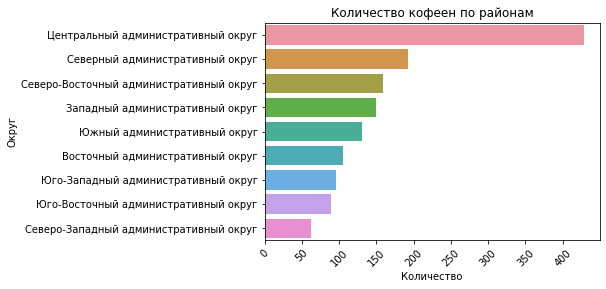

In [60]:
coffe_d = data_coffee.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False)
ax = sns.barplot(y=coffe_d.index, x='name', data=coffe_d)
plt.xlabel('Количество')
plt.ylabel('Округ')
plt.title('Количество кофеен по районам')
plt.xticks(rotation=45);

In [61]:
d = data.loc[data['category']=='кофейня']
d = d.dropna(subset=['middle_coffee_cup'])
d.shape[0]

521

Информация о стоимости сашки капучино представлена только о 521 кофейне.

**Распределение стоимости чашки капучино по АО**

In [62]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

Choropleth(
    geo_data=state_geo,
    data=d,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино',
).add_to(m)

m

**Распределение среднего рейтинга кофеен по АО**

In [63]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

Choropleth(
    geo_data=state_geo,
    data=data_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен',
).add_to(m)

m

Самые дорогие кофейни в центре и в ЮАО, а самые дешевые в ЗАО. При этом в ЮАО довольно высокий средний рейтинг у кофеен, а в ЗАО, наоборот - низкий.

In [64]:
data_24.loc[data['category']=='кофейня']['name'].count()

76

- Всего кофеен в Москве 1413 (из низ 76 - круглосуточные). Больше всего в ЦАО - 428, а меньше всего СЗАО \
- Самые дорогие кофейни в центре и в ВАО (192-215 рублей за чашку капучино), а самые дешевые в ЗАО, ЮВАО и САО. 
- в ЮАО и СВАО самый высокий средний рейтинг у кофеен, а в ЗАО, САО и ЮВАО, наоборот, - низкий.
- Вероянтно, в ВАО будет довольно большая конкуренция, так как рейтинги кофеен там наилучшие при самой высокой средней стоимости чашки капучино (как в Центре).

**Рекомендации по открытию кофейни**

- Лучше всего открывать кофейню там, где невысокая конкуренция. Так, например, лучше не рассматривать ЦАО, так как кофеен там уже очень много. Стоит взять Западный административный округ, так как там немного кофеен, также средний рейтинг имеющихся совсем небольшой - от 4.0 до 4.2. Думаю, идея с воссозданием кофейни из сериала "Друзья" привлечет много посетитей, которые не захотят идти в те места, где рейтинг довольно небольшой. 
- Лучше ориентироваться на не очень высокую стоимость кофе, так как средняя стоимость по ЗАО - от 79 до 102. Чтобы клиенты были более лояльны, лучше чильно не превышать эту цену, а установить среднюю стоимость примерно 102-124.
- Более того, в ЗАО самая высокая средняя цена во всех  категориях, что говорит о платежеспособности населения в этом районе.
- При этом кофейню лучше располагать ближе к центру, нежеле к МКАДУ, чтобы посетители могл приезжать из других районов. \
Примерное место будущей кофейни может быть тут:

In [65]:
#координаты
lat, lng = 55.742901, 37.498417

# создаём карту с центром в точке расположения кофейни и начальным зумом 17
m = folium.Map(location=[lat, lng], zoom_start=17, tiles='Cartodb Positron')
# создаём маркер в точке расположения кофейни и сразу добавляем на карту
folium.Marker([lat, lng]).add_to(m)

# выводим карту
m


# Презентация

Презентация: <https://drive.google.com/file/d/1RG95GYzR2oUMaOKksbRfJS810ouijhjc/view?usp=drive_link> 